Our project involves processing and classifying geological core images for lithological analysis using deep learning techniques. Here is a summary of our approach:

a)Data Preparation: We determined the correlation between real depth measurements and their representation in pixels on images. This allowed us to calculate the number of pixels corresponding to 0.01 meters of depth to precisely segment the core images.

b)Image Segmentation: We segmented the core images into smaller slices, with each segment representing a depth slice of 0.01 meters, to enable detailed analysis and classification of each individual segment.

c)Format Conversion: We converted files from the .npy format to .png images to integrate them into our existing image processing pipeline.

d)Facies Labeling: We associated facies labels with each image segment using data from a CSV file that provides facies classes based on depth.

e)Image Cropping: Each segment was centered and cropped to eliminate unnecessary edges and focus on the central area, which is most informative for classification.

f)Model Training: We used PyTorch to develop and train a deep learning model on the labeled segments to classify lithological types.

g)Model Evaluation: The model was tested on a validation dataset to assess its performance and generalization ability.

h)Classification and Visualization: The facies predictions for the test images were visualized by superimposing colors on the base image, with each color representing a different facies class.

i) Project Packaging: We considered creating a Python package to encapsulate the entire processes, including data preparation, model training, evaluation, and visualization, to facilitate use and distribution.

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
import sys
sys.path.append('/content/drive/My Drive')
import classifier_final as cl

Cuda installed! Running on GPU!


In [2]:
!pip install pycm livelossplot
%pylab inline

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 70.3/70.3 kB 2.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 599.8/599.8 kB 35.4 MB/s eta 0:00:00
Populating the interactive namespace from numpy and matplotlib


## DATA PREPARATION FOR TRAINING

In [4]:
df = cl.total_dataframe()

9278
9277
9277
9277
7588


In [5]:
facies_labels = {label: idx for idx, label in enumerate(set(d['facies'] for d in df))}
inverse_facies_labels = {v: k for k, v in facies_labels.items()}

In [6]:
inverse_facies_labels

{0: 'is', 1: 'os', 2: 'sh', 3: 'nc', 4: 's'}

In [7]:
train_loader, val_loader, test_loader = cl.split_data(df)

## **You need to uncomment the following line if you want to train the model with the data and display the accuracy and loss graphs**

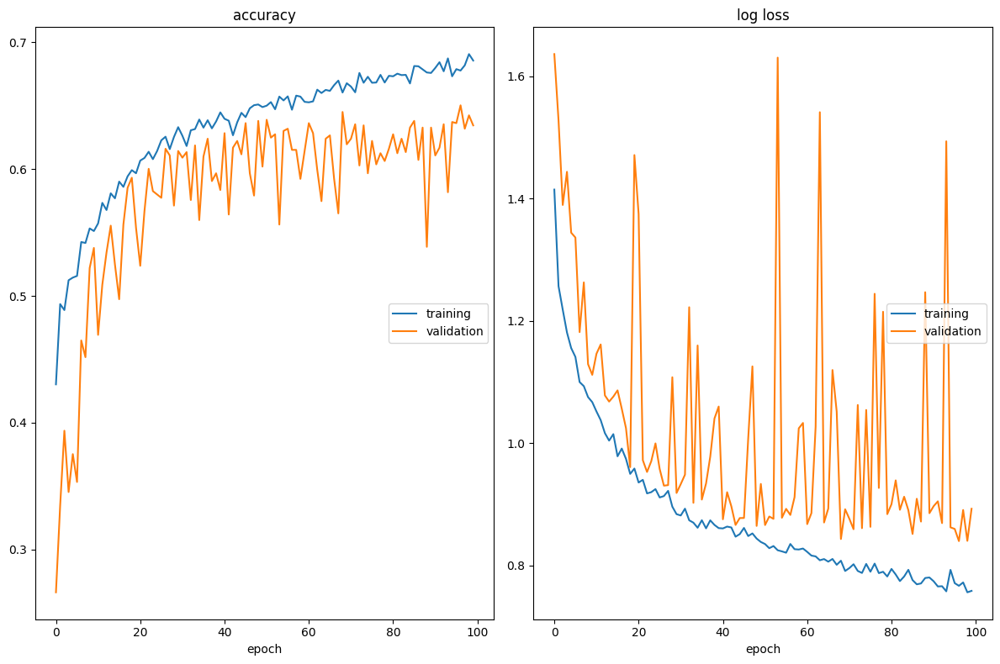

accuracy
	training         	 (min:    0.430, max:    0.691, cur:    0.686)
	validation       	 (min:    0.266, max:    0.650, cur:    0.634)
log loss
	training         	 (min:    0.756, max:    1.415, cur:    0.759)
	validation       	 (min:    0.840, max:    1.637, cur:    0.893)


In [12]:
model = cl.train2(train_loader, val_loader)

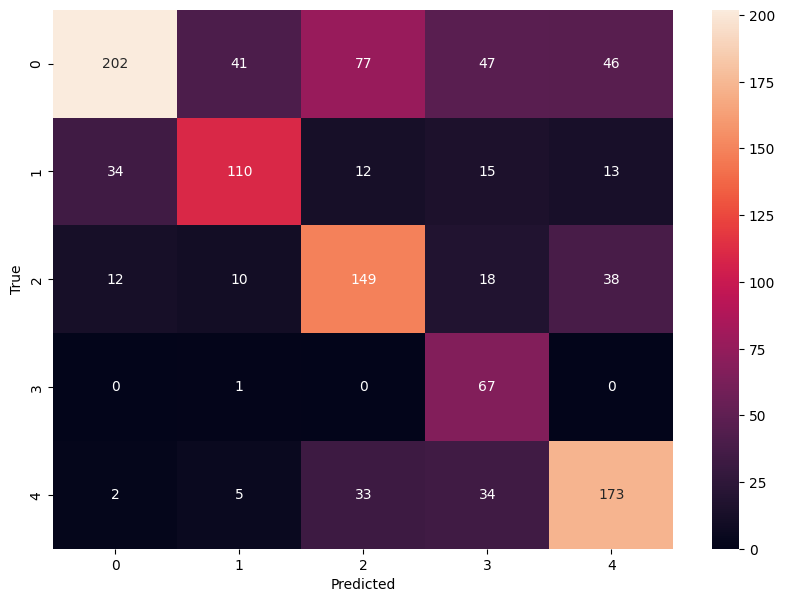

1

In [18]:
cl.pred(model, test_loader)[0]

In [31]:
facies_labels

{'is': 0, 'os': 1, 'sh': 2, 'nc': 3, 's': 4}

 specific function for processing input for prediction (this function must not be used for the dataset but only for unseen data)

To predict the lithofacies of unlabelled cores, the core's .npy file and its associated .csv file must be deposited in this folder
: '/content/drive/My Drive/unseen/'


Here I've used 204-20-1Z for the illustration but you'll need to replace it with the name of the core to be predicted.

In [19]:
loader = cl.process_data('/content/drive/My Drive/unseen/204-20-1Z.npy', '/content/drive/My Drive/unseen/204-20-1Z.csv')

12.0
[<PIL.Image.Image image mode=RGBA size=395x18 at 0x79BF882FAA10>, <PIL.Image.Image image mode=RGBA size=395x18 at 0x79BF882FAE60>, <PIL.Image.Image image mode=RGBA size=395x18 at 0x79BF882FBBE0>, <PIL.Image.Image image mode=RGBA size=395x18 at 0x79BF882FB400>, <PIL.Image.Image image mode=RGBA size=395x18 at 0x79BF882F98D0>, <PIL.Image.Image image mode=RGBA size=395x18 at 0x79BF882FAB90>, <PIL.Image.Image image mode=RGBA size=395x18 at 0x79BF882FB2E0>, <PIL.Image.Image image mode=RGBA size=395x18 at 0x79BF882F8190>, <PIL.Image.Image image mode=RGBA size=395x18 at 0x79BF882F95D0>, <PIL.Image.Image image mode=RGBA size=395x18 at 0x79BF882FB730>, <PIL.Image.Image image mode=RGBA size=395x18 at 0x79BF882FA230>, <PIL.Image.Image image mode=RGBA size=395x18 at 0x79BF882F8940>, <PIL.Image.Image image mode=RGBA size=395x18 at 0x79BF882FB6D0>, <PIL.Image.Image image mode=RGBA size=395x18 at 0x79BF882F81F0>, <PIL.Image.Image image mode=RGBA size=395x18 at 0x79BF882FB820>, <PIL.Image.Image im

In [20]:
prediction = cl.prediction_unseen_well(loader, model, inverse_facies_labels)

In [21]:
final_image = cl.plot_prediction('/content/drive/My Drive/unseen/204-20-1Z.npy', '/content/drive/My Drive/unseen/204-20-1Z.csv', prediction)

In [26]:
facies_colors2 = {
      's': (255, 0, 0, 128) ,   # red with transparency
      'sh': (0, 255, 0, 128),  # green with transparency
      'nc': (0, 0, 0, 128),    # black with transparency
      'is': (0, 0, 255, 128),  # blue with transparency
      'os': (255, 255, 0, 128) # yellow with transparency
  }

facies_colors2


{'s': (255, 0, 0, 128),
 'sh': (0, 255, 0, 128),
 'nc': (0, 0, 0, 128),
 'is': (0, 0, 255, 128),
 'os': (255, 255, 0, 128)}

In [27]:
print('s : red with transparency')
print('sh : green with transparency')
print('nc : black with transparency')
print('is : blue with transparency')
print('os : yellow with transparency')

s : red with transparency
sh : green with transparency
nc : black with transparency
is : blue with transparency
os : yellow with transparency


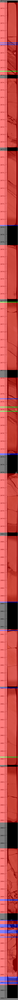

In [22]:
final_image

### To adapt the unseen core label to my label

In [ ]:
import pandas as pd

def replace_facies_class_names(csv_file):


    df = pd.read_csv(csv_file)

    df.loc[df['Facies Class Name'] == 'bs', 'Facies Class Name'] = 'nc'

    df.loc[df['Facies Class Name'] == 'ih', 'Facies Class Name'] = 'is'

    df_facies_changed = df

    return df_facies_changed


In [ ]:
# df_facies_changed = replace_facies_class_names('/content/drive/My Drive/unseen/XXXX')

### My predictions are for 0.01 m windows, so now I'm going to combine the predictions that follow each other when they are the same.

In [29]:
from itertools import groupby

prediction_regroup = [k for k, g in groupby(prediction)]

print(prediction_regroup)

['nc', 's', 'is', 's', 'is', 's', 'sh', 's', 'nc', 's', 'nc', 's', 'is', 'nc', 's', 'nc', 'sh', 's', 'nc', 's', 'is', 's', 'sh', 's', 'sh', 's', 'is', 'nc', 's', 'nc', 's', 'is', 'nc', 's', 'is', 's', 'nc', 'is', 's', 'sh', 's', 'nc', 's', 'nc', 's', 'is', 's', 'nc', 'is', 's', 'is', 's', 'is', 's', 'is', 's', 'is', 's', 'is', 's', 'nc']
